In [20]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter

import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms

from tqdm import tqdm
from IPython.display import Image as IPImage, display

from torchvision import transforms
from PIL import Image
import pandas as pd
import numpy as np
import os

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')



In [4]:
class CustomDataset(Dataset):
    def __init__(self, img_folder, csv_file, transform=None):
        self.img_folder = img_folder
        self.csv_file = csv_file
        self.transform = transform
        
        # Read CSV file containing image filenames and one-hot encoded labels
        self.data_info = pd.read_csv(csv_file)
        
        # Number of items in the dataset
        self.data_len = len(self.data_info)
        
    def __getitem__(self, index):
        # Get image name from the dataframe
        img_name = os.path.join(self.img_folder, self.data_info.iloc[index, 0] + '.jpg') # Add file extension
        
        # Open image
        image = Image.open(img_name)
        
        # Apply transformations if any
        if self.transform is not None:
            image = self.transform(image)
        
        # Get one-hot encoded label from the dataframe
        label = self.data_info.iloc[index, 1:].values.astype(np.float32) # Convert labels to float32
        
        # Convert one-hot encoded label to normal label
        label = np.argmax(label)
        
        return image, label
    
    def __len__(self):
        return self.data_len


In [5]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
      transforms.Normalize(
            [0.5 for _ in range(3)], [0.5 for _ in range(3)]),]
)


In [6]:
# Example dataset instantiation
dataset = CustomDataset(img_folder='/kaggle/input/dataset-isisc-2016/Train_data-001/Train_data',
                        csv_file='/kaggle/input/dataset-isisc-2016/Train-20240404T194350Z-002/Train/Train_labels.csv',
                        transform=transform)



In [7]:
# Example dataloader creation
trainloader = DataLoader(dataset, batch_size=32, shuffle=False)

torch.Size([1, 2592, 3872])


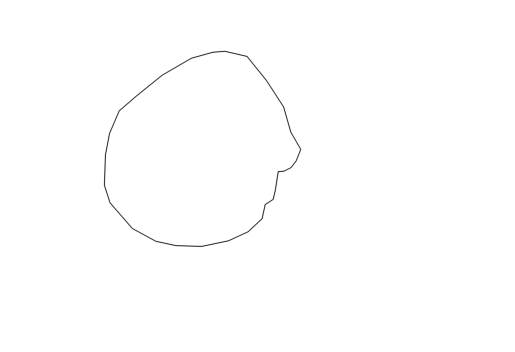

In [8]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms

def load_random_image(folder_path):
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

    random_image_filename = random.choice(image_files)
    random_image_path = os.path.join(folder_path, random_image_filename)

    image = Image.open(random_image_path)
    transform = transforms.Compose([transforms.ToTensor()])
    image_tensor = transform(image)

    return image, image_tensor

# Example usage:
folder_path = "/kaggle/input/dataset-isisc-2016/Train-20240404T194350Z-002/Train/Train_sketch/Contours"
random_image, random_image_tensor = load_random_image(folder_path)

print(random_image_tensor.shape)

# Plot the image
plt.imshow(random_image,cmap='gray')
plt.axis('off')  # Turn off axis
plt.show()


In [9]:
batch_demo = next(iter(trainloader))
batch_demo[0].shape

torch.Size([32, 3, 224, 224])

In [10]:
batch_demo[1].shape


torch.Size([32])

In [11]:
batch_demo[1]

tensor([1, 1, 1, 1, 0, 1, 4, 0, 1, 0, 1, 1, 5, 1, 1, 1, 1, 0, 4, 1, 1, 1, 1, 3,
        5, 2, 2, 0, 1, 1, 4, 4])

In [12]:
images, labels = batch_demo

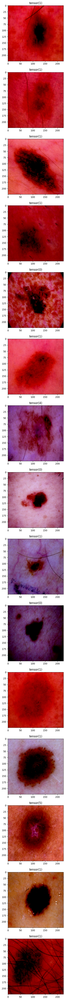

In [13]:
num_images = min(len(images), 15)  # Display up to 15 images

plt.figure(figsize=(15, 5 * num_images))

for i in range(num_images):
    image, label = images[i], labels[i]

    # Display image
    plt.subplot(num_images, 2, 2 * i + 1)
    plt.imshow(np.transpose(image.numpy(), (1, 2, 0)))  
    plt.title(str(label))
plt.show()

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d, num_classes, image_size):
        super(Discriminator, self).__init__()
        self.image_size = image_size
        self.disc = nn.Sequential(
            # input: N x channels_img x 224 x 224
            nn.Conv2d(channels_img + 1, features_d, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            # State size: (features_d, 128, 128)
            nn.Conv2d(features_d, features_d * 2, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(features_d * 2, affine=True),
            nn.LeakyReLU(0.2),
            # State size: (features_d * 2, 32, 32)
            nn.Conv2d(features_d * 2, features_d * 4, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(features_d * 4, affine=True),
            nn.LeakyReLU(0.2),
            # State size: (features_d * 4, 8, 8)
            nn.Conv2d(features_d * 4, features_d * 8, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(features_d * 8, affine=True),
            nn.LeakyReLU(0.2),
            # State size: (features_d * 8, 4, 4)
            nn.Conv2d(features_d * 8, features_d * 16, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(features_d * 16, affine=True),
            nn.LeakyReLU(0.2),
            # State size: (features_d * 16, 2, 2)
            nn.Conv2d(features_d * 16, features_d * 16, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(features_d * 16, affine=True),
            nn.LeakyReLU(0.2),
            # State size: (features_d * 16, 1, 1)
            nn.Conv2d(features_d * 16, 1, kernel_size=3, stride=2, padding=0),
        )

        self.embed = nn.Embedding(num_classes, image_size * image_size)

    def forward(self, x, labels):
        embedding = self.embed(labels).view(labels.shape[0], 1, self.image_size, self.image_size)
        x = torch.cat([x, embedding], dim=1)
        return self.disc(x)

class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g, num_classes, image_size, embed_size):
        super(Generator, self).__init__()
        self.embed = nn.Embedding(num_classes, embed_size)
        self.image_size = image_size
        self.net = nn.Sequential(
            # Input: N x channels_noise x 1 x 1
            nn.ConvTranspose2d(channels_noise + embed_size, features_g * 16, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(features_g * 16),
            nn.ReLU(),
            # State size: (features_g * 16, 4, 4)
            nn.ConvTranspose2d(features_g * 16, features_g * 8, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(features_g * 8),
            nn.ReLU(),
            # State size: (features_g * 8, 8, 8)
            nn.ConvTranspose2d(features_g * 8, features_g * 4, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(features_g * 4),
            nn.ReLU(),
            # State size: (features_g * 4, 16, 16)
            nn.ConvTranspose2d(features_g * 4, features_g * 2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(features_g * 2),
            nn.ReLU(),
            # State size: (features_g * 2, 32, 32)
            nn.ConvTranspose2d(features_g * 2, features_g, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(features_g),
            nn.ReLU(),
            # State size: (features_g, 128, 128)
            nn.ConvTranspose2d(features_g, channels_img, kernel_size=4, stride=2, padding=1),
            # Output: N x channels_img x 224 x 224
            nn.Upsample(size=(image_size, image_size), mode='bilinear', align_corners=True),
            nn.Tanh(),
        )

    def forward(self, x, labels):
        embedding = self.embed(labels).unsqueeze(2).unsqueeze(3)
        x = torch.cat([x, embedding], dim=1)
        return self.net(x)

def initialize_weights(model,device='cpu'):
    # Initializes weights according to the DCGAN paper if necessary, we will see if needed or not 
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02).to(device)



In [15]:
device

device(type='cuda')

In [16]:
# Check the models with random noise and random labels
image_size = 224

# labels
num_classes = 7

labels = torch.randint(0, num_classes, (16,)).to(device)
gen = Generator(channels_noise=100, channels_img=3, features_g=64, 
                num_classes=num_classes, image_size=image_size, embed_size=100).to(device)

critic = Discriminator(channels_img=3, features_d=64, 
                     num_classes=num_classes, image_size=image_size).to(device)

initialize_weights(gen)
initialize_weights(critic)
x = torch.randn((16, 100, 1, 1)).to(device)
gen_out = gen(x, labels)
print(gen_out.shape)
disc_out = critic(gen_out, labels)
print(disc_out.shape)

torch.Size([16, 3, 224, 224])
torch.Size([16, 1, 1, 1])


In [17]:
def gradient_penalty(critic, real, labels, fake, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    alpha = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * alpha + fake * (1 - alpha)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images,labels)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

In [18]:
device

device(type='cuda')

 32%|███▏      | 100/313 [03:49<08:08,  2.29s/it]

Epoch [0/100] Batch 100/313                 Loss D: -490.1107, loss G: 504.9271


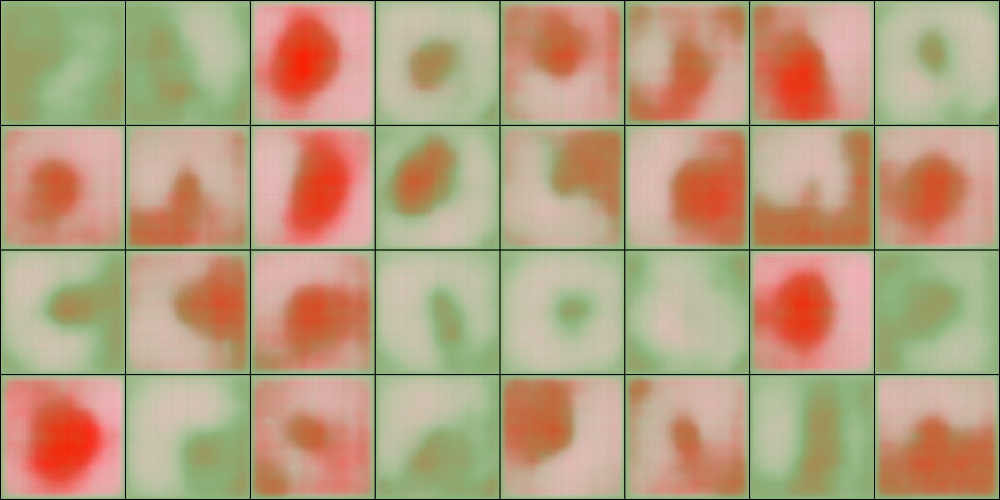

 64%|██████▍   | 200/313 [08:21<05:03,  2.69s/it]

Epoch [0/100] Batch 200/313                 Loss D: -298.7373, loss G: 433.3040


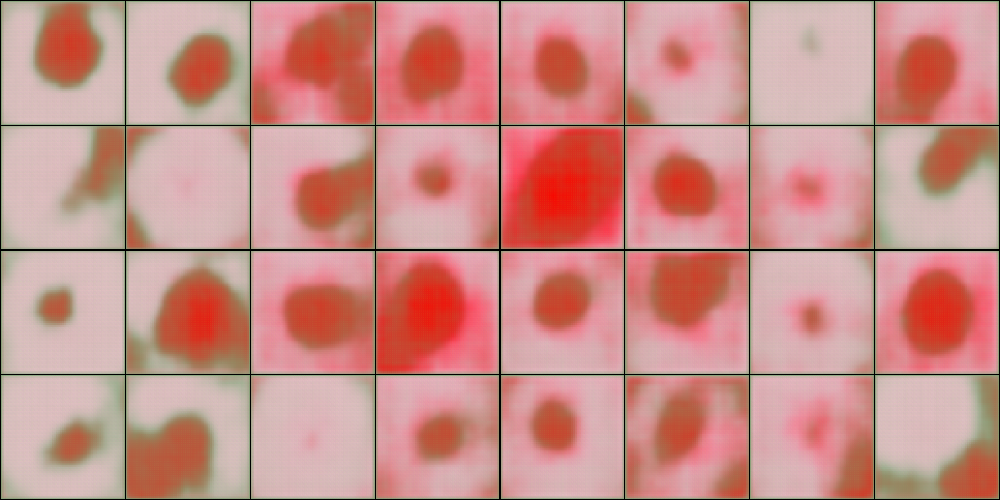

 96%|█████████▌| 300/313 [12:54<00:35,  2.70s/it]

Epoch [0/100] Batch 300/313                 Loss D: -200.4440, loss G: 487.4752


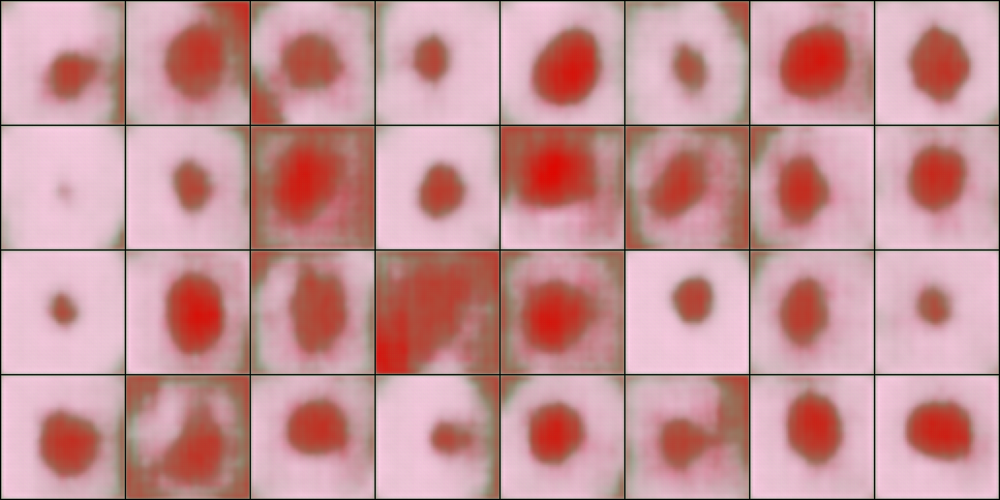

 32%|███▏      | 100/313 [03:49<08:08,  2.29s/it]

Epoch [1/100] Batch 100/313                 Loss D: -81.0712, loss G: 453.2112


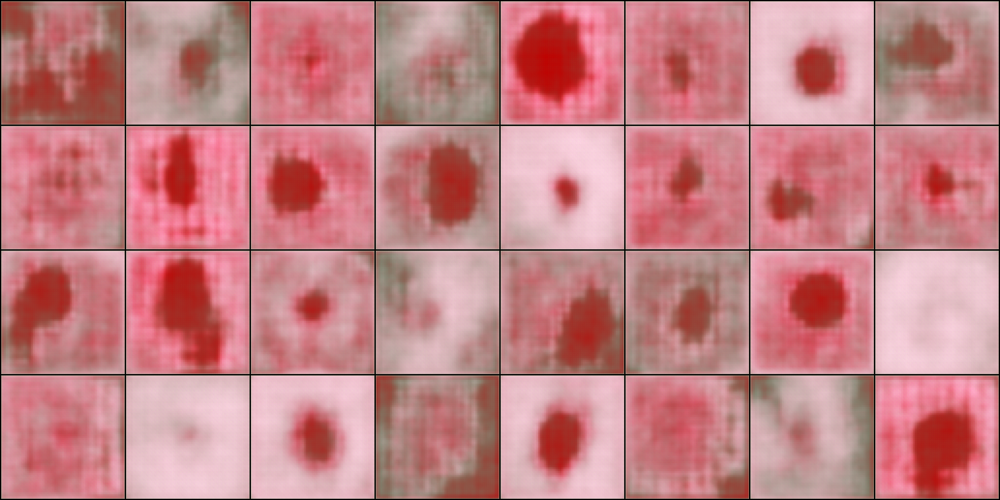

 64%|██████▍   | 200/313 [07:40<04:19,  2.29s/it]

Epoch [1/100] Batch 200/313                 Loss D: -93.7777, loss G: 484.2554


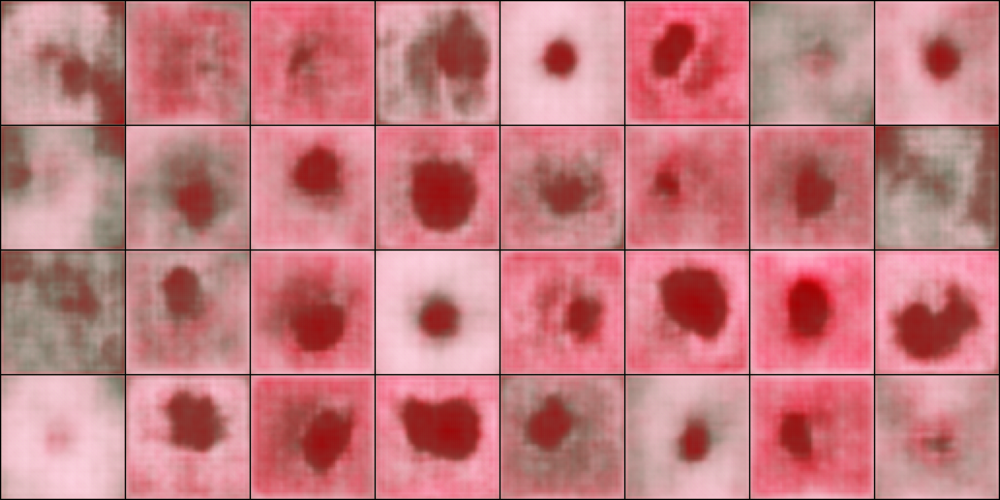

 96%|█████████▌| 300/313 [11:31<00:29,  2.29s/it]

Epoch [1/100] Batch 300/313                 Loss D: -110.2947, loss G: 418.6254


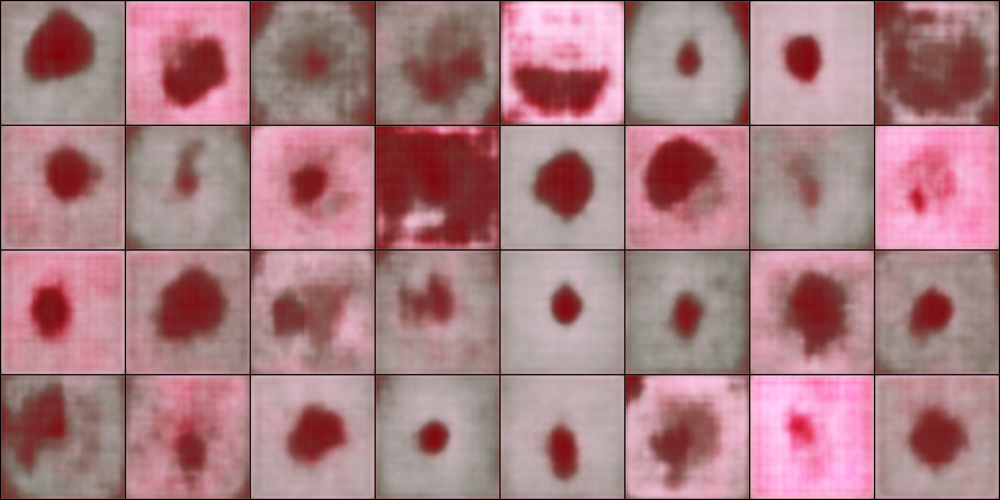

  8%|▊         | 25/313 [00:57<11:00,  2.29s/it]

In [ ]:
#Hyperparameters etc.
LEARNING_RATE = 1e-4
CRITIC_ITERATIONS = 5
LAMBDA_GP = 10
NUM_EPOCHS = 100

# initialize gen and disc, note: discriminator should be called critic,
# according to WGAN paper (since it no longer outputs between [0, 1])


# initializate optimizer
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
opt_critic = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))

# for tensorboard plotting
step = 0

gen.train()
critic.train()

for epoch in range(NUM_EPOCHS):
    for batch_idx, (real,labels) in enumerate(tqdm(trainloader)):
        real = real.to(device)
        cur_batch_size = real.shape[0]
        labels = labels.to(device)
        
        # Train Critic: max E[critic(real)] - E[critic(fake)]
        # equivalent to minimizing the negative of that
        for _ in range(CRITIC_ITERATIONS):
            noise = torch.randn(cur_batch_size, 100, 1, 1).to(device)
            fake = gen(noise,labels)
            critic_real = critic(real,labels).reshape(-1)
            critic_fake = critic(fake,labels).reshape(-1)
            gp = gradient_penalty(critic,real, labels, fake, device)
            loss_critic = (
                -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            )
            critic.zero_grad()
            loss_critic.backward(retain_graph=True)
            opt_critic.step()

        # Train Generator: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        
        gen_fake = critic(fake,labels).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        # Print losses occasionally
        if batch_idx % 100 == 0 and batch_idx > 0:
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(trainloader)} \
                Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}"
            )
            
            # Save and display generated images
            with torch.no_grad():
                fake = gen(noise, labels)
                torchvision.utils.save_image(fake[:32], f"fake_images_{epoch}_{batch_idx}.png", normalize=True)
                display(IPImage(f"fake_images_{epoch}_{batch_idx}.png"))


            step += 1